Let's get started with image stitching.

The algorithm I am going to use is similar to the method proposed by Brown and Lowe in their 2017 paper, [Automatic Panoramic Image Stitching with Invariant Features.](http://matthewalunbrown.com/papers/ijcv2007.pdf)

####  Algorithm: Automatic Panorama Stitching
**Input: n unordered images**
* Extract SIFT features from all n images
* Find k nearest-neighbors for each feature 
* For each image:
        1. Select m candidate matching images that have the most feature matches to this image
        2. Find geometrically consistent feature matches using RANSAC to solve for the homography between pairs of images
        3. Verify image matches using a probabilistic model
* Find connected components of image matches
* For each connected component:
       1. Perform bundle adjustment to solve for the rotation θ1, θ2, θ3 and focal length f of all cameras
       2. Render panorama using multi-band blending
  
**Output: Panoramic image(s)**

# Map for RGB images

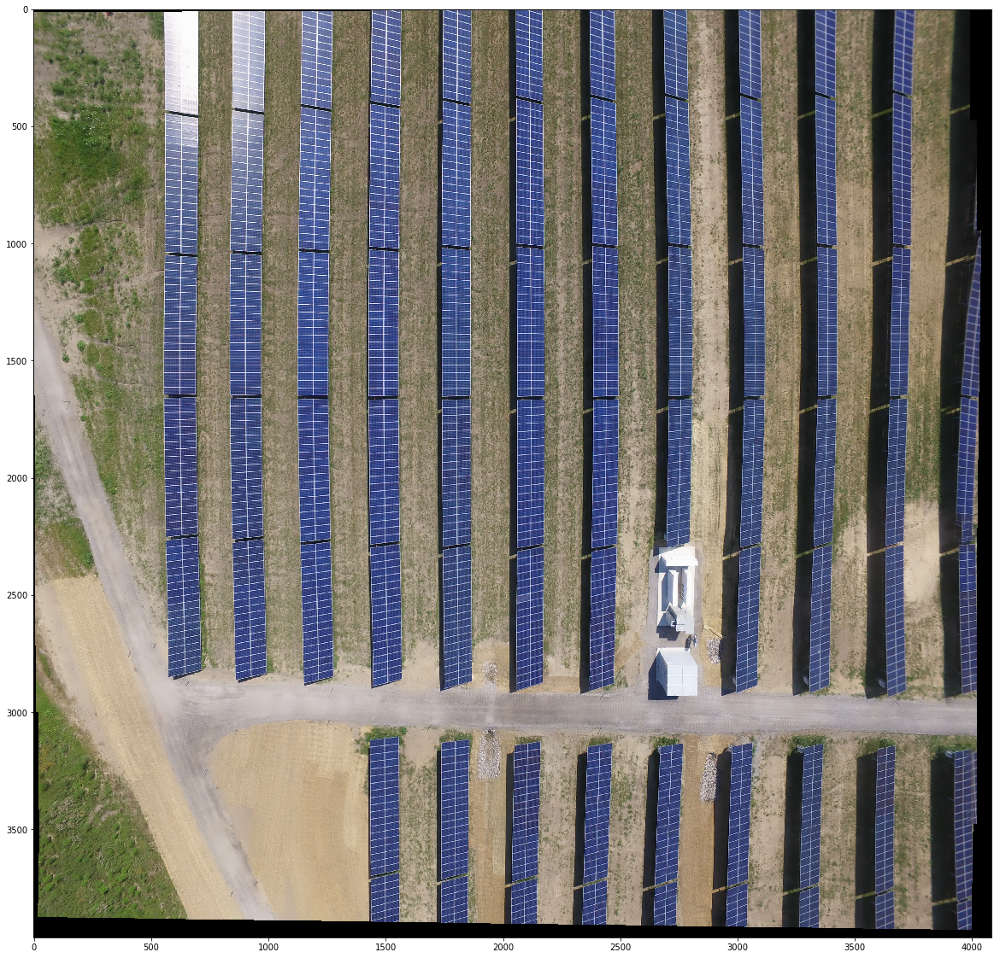

In [1]:
import cv2
import glob
import numpy as np
import matplotlib.pyplot as plt

#load all the images for stitching
images = []
for img in glob.glob("../input/test_dataset/images_RGB/*.JPG"):
    image = cv2.imread(img)
    images.append(image)
    
stitcher = cv2.Stitcher_create(True)
status, stitched_rgb = stitcher.stitch(images)

#if stiching is successful then status == 0 and we will save the stitched image
if status == 0:    
    plt.figure(figsize=(30,20))
    plt.imshow(cv2.cvtColor(stitched_rgb, cv2.COLOR_BGR2RGB))
    
# otherwise the stitching failed, likely due to not enough keypoints being detected
else:
    print("[INFO] image stitching failed ({})".format(status))

# Map For IR images

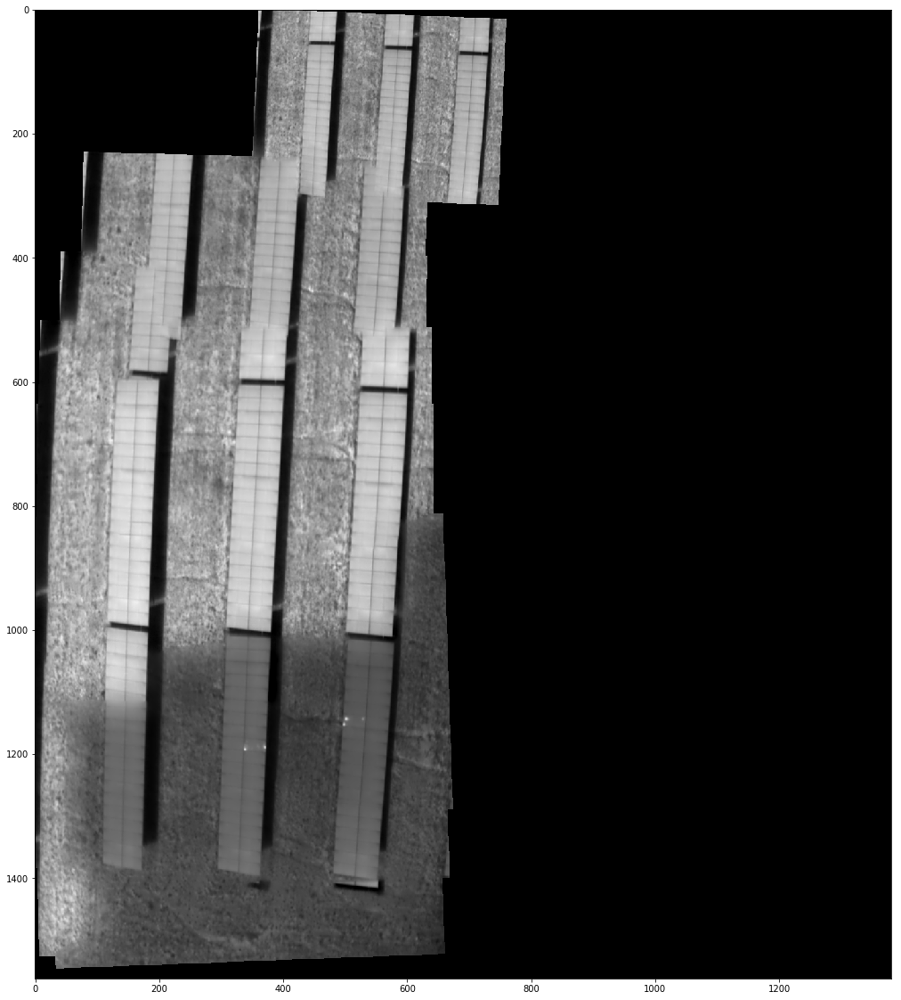

In [3]:
ir_images = []
for img in glob.glob("../input/test_dataset/images_IR/*.jpg"):
    image = cv2.imread(img)
    ir_images.append(image)
    
stitcher = cv2.Stitcher_create(True)
status, ir_stitched = stitcher.stitch(ir_images)

#if stiching is successful then status == 0 and we will save the stitched image
if status == 0:
    plt.figure(figsize=(30,20))
    plt.imshow(cv2.cvtColor(ir_stitched, cv2.COLOR_BGR2RGB))
    
# otherwise the stitching failed, likely due to not enough keypoints being detected
else:
    print("[INFO] image stitching failed ({})".format(status))

There is so much of black part in the final image (MAP), we can avoid that by cropping the biggest counter in our Map.


## Now Let's draw Green border around the solar panels

# For RGB

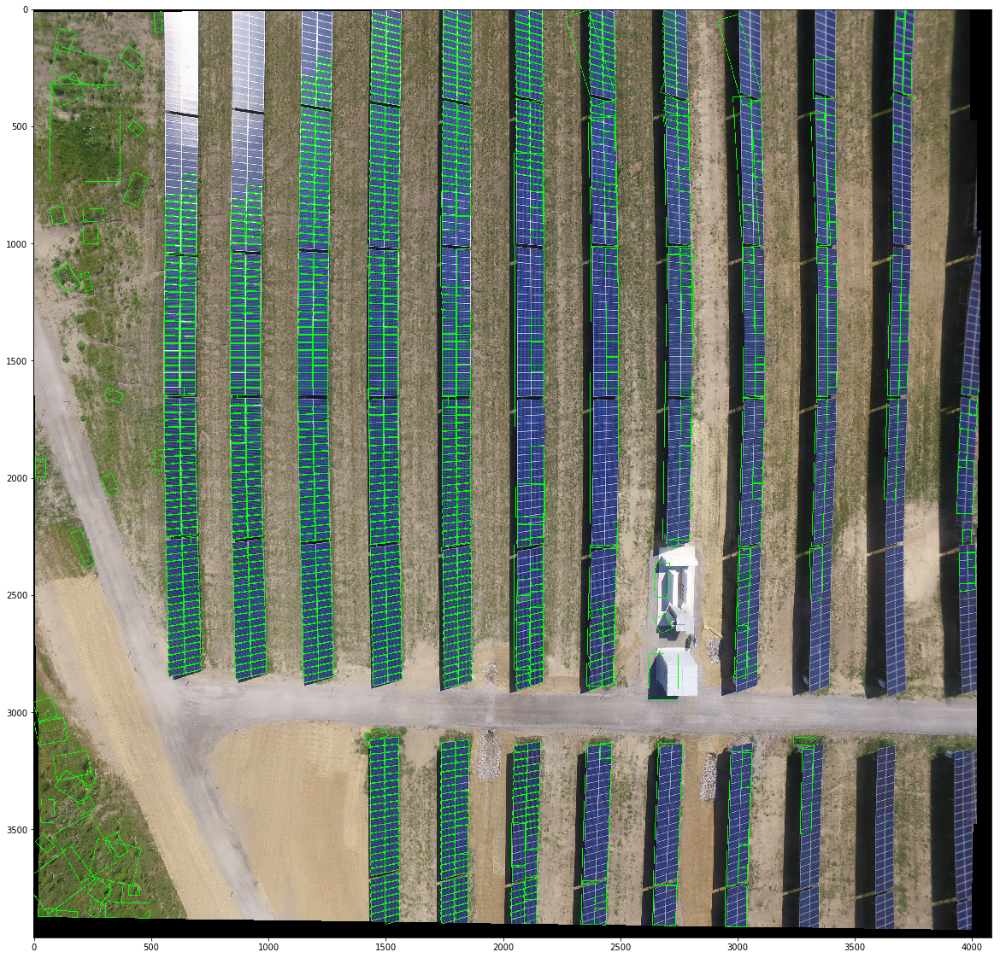

In [4]:
img = stitched_rgb.copy()
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
blur = cv2.GaussianBlur(hsv,(5,5),0)
lower_blue = np.array([38, 86, 0])
upper_blue = np.array([121, 255, 255])
mask = cv2.inRange(blur, lower_blue, upper_blue)
contours, hierarchy = cv2.findContours(mask, cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)

try: hierarchy = hierarchy[0]
except: hierarchy = []
for contour, hier in zip(contours, hierarchy):
    area = cv2.contourArea(contour)
    if area > 1200 and area < 250000:
        rect = cv2.minAreaRect(contour)
        box = cv2.boxPoints(rect)
        box = np.int0(box)
        cv2.drawContours(img,[box],0,(0,255,0),2)

plt.figure(figsize=(30,20))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

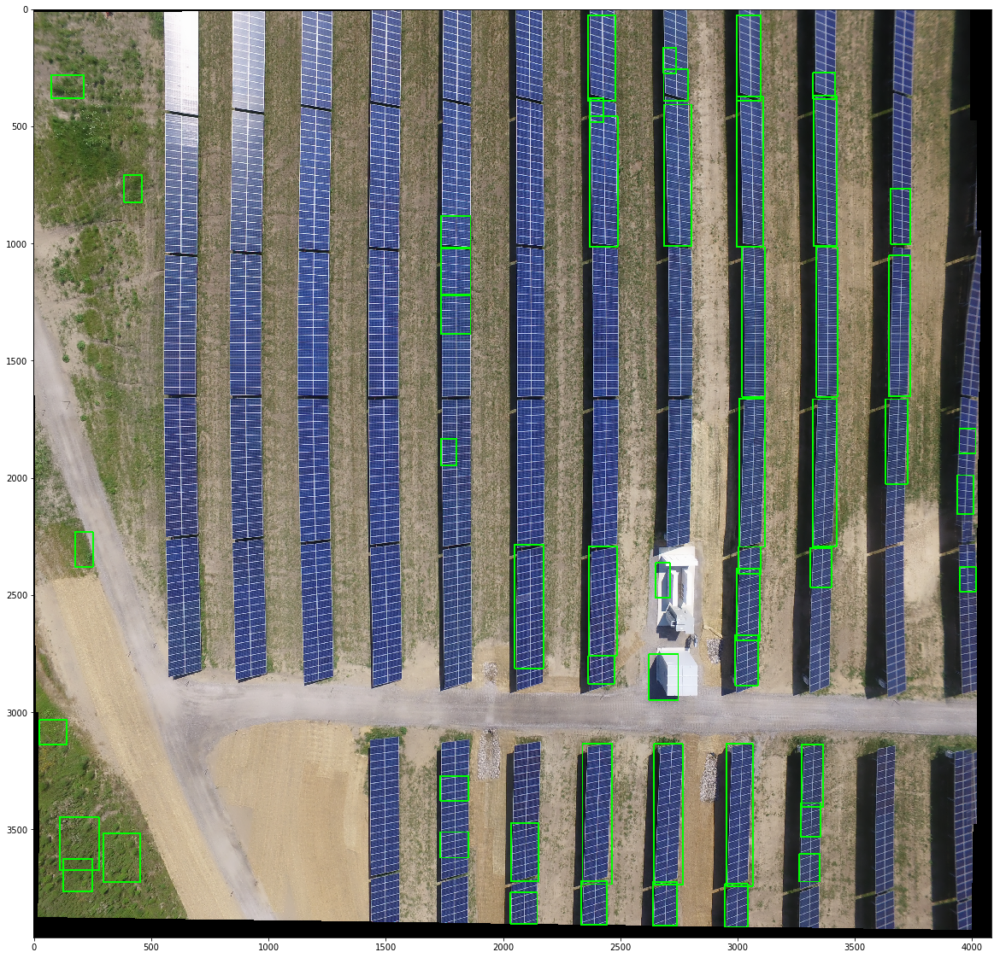

In [5]:
img = stitched_rgb.copy()
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
blur = cv2.GaussianBlur(hsv,(11,5),0)
lower_blue = np.array([38, 86, 0])
upper_blue = np.array([121, 255, 255])
mask = cv2.inRange(blur, lower_blue, upper_blue)

#ret,thresh1 = cv2.threshold(blur[:,:,0],100,255,cv2.THRESH_BINARY)
contours, hierarchy = cv2.findContours(mask, cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
try: hierarchy = hierarchy[0]
except: hierarchy = []

# computes the bounding box for the contour, and draws it on the image,
for contour, hier in zip(contours, hierarchy):
    area = cv2.contourArea(contour)

    if area > 1000 and area < 250000:
        (x,y,w,h) = cv2.boundingRect(contour)
        if w > 50 and h > 100 and w<200 and h<800:
            cv2.rectangle(img, (x,y), (x+w,y+h), (0, 255, 0), 5)


plt.figure(figsize=(30,20))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

I have tried so many things but It's not working quite well, let's try GrayScale.

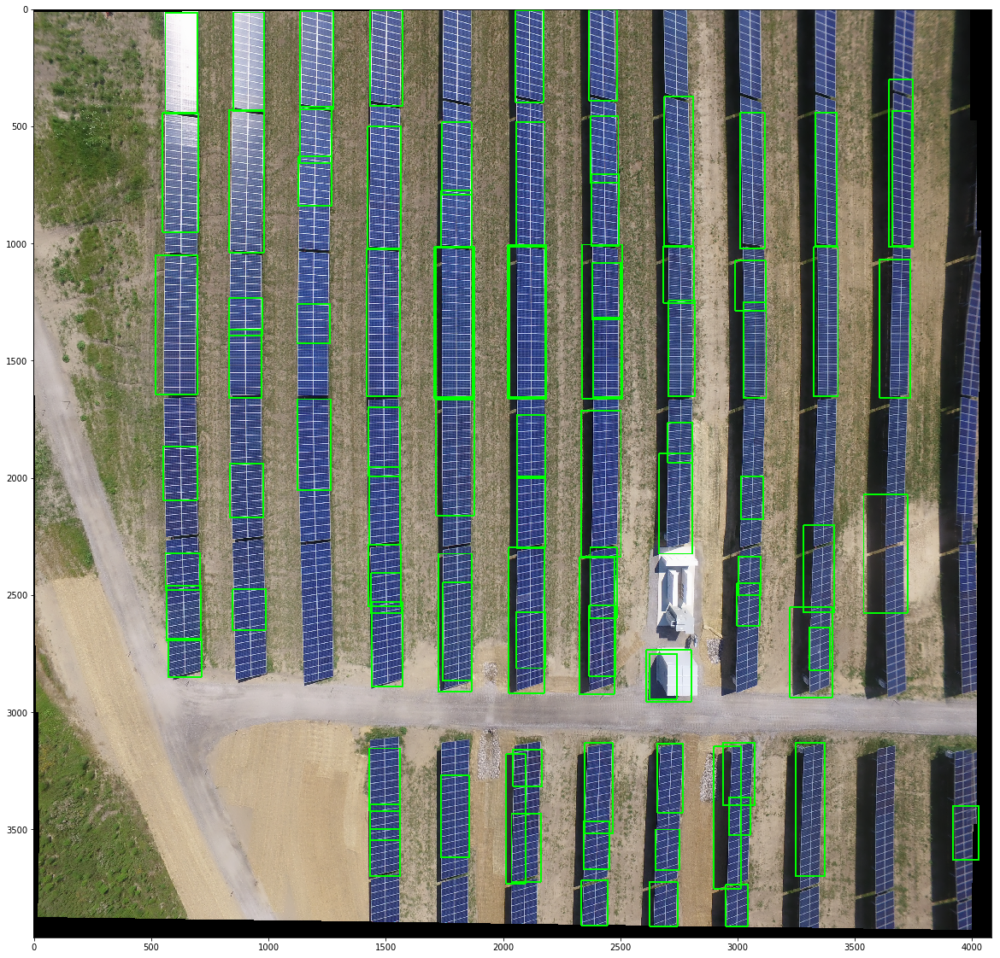

In [6]:
count_bb_rgb = 0
img = stitched_rgb.copy()
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray,(11,5),0)
edges = cv2.Canny(blur,100,200)    
th3 = cv2.adaptiveThreshold(edges,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,11,2)
contours, hierarchy = cv2.findContours(th3, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
try: hierarchy = hierarchy[0]
except: hierarchy = []


# computes the bounding box for the contour, and draws it on the image,
for contour, hier in zip(contours, hierarchy):
    area = cv2.contourArea(contour)

    if area > 1000 and area < 250000:      
        (x,y,w,h) = cv2.boundingRect(contour)
        if w >80 and h >150 and w<200 and h<800:
            cv2.rectangle(img, (x,y), (x+w,y+h), (0, 255, 0), 5)
            count_bb_rgb +=1

plt.figure(figsize=(30,20))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

This  result is pretty good.
##  Let's do this for IR MAP..

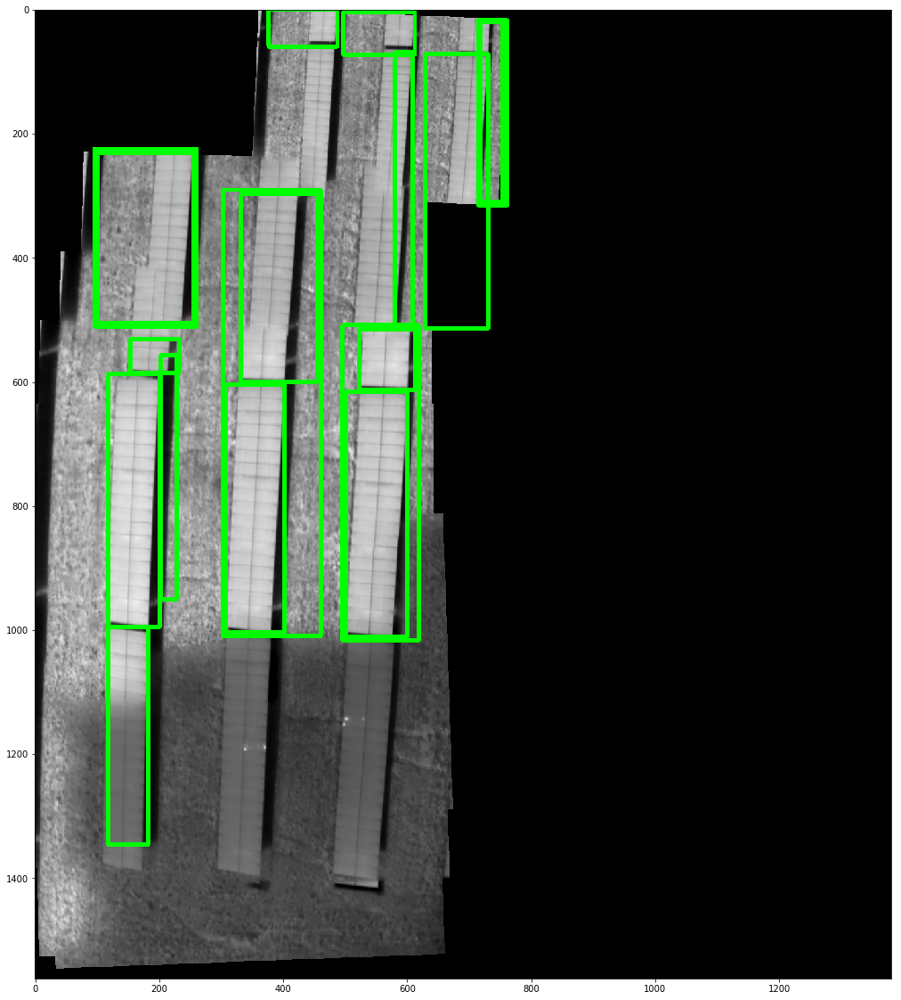

In [7]:
count_bb_ir= 0
img_ir = ir_stitched.copy()                               #IR_map
gray = cv2.cvtColor(img_ir, cv2.COLOR_BGR2GRAY)           
blur = cv2.GaussianBlur(gray,(11,5),0)
edges = cv2.Canny(blur,100,200)    
th3 = cv2.adaptiveThreshold(edges,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,11,2)
contours, hierarchy = cv2.findContours(th3, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
try: hierarchy = hierarchy[0]
except: hierarchy = []

# computes the bounding box for the contour, and draws it on the image,
for contour, hier in zip(contours, hierarchy):
    area = cv2.contourArea(contour)

    #if area > 10 and area < 250000:
    (x,y,w,h) = cv2.boundingRect(contour)
    if w > 25 and h > 30 and w<200 and h<800:
        cv2.rectangle(img_ir, (x,y), (x+w,y+h), (0, 255, 0), 5)
        count_bb_ir +=1

plt.figure(figsize=(30,20))
plt.imshow(cv2.cvtColor(img_ir, cv2.COLOR_BGR2RGB))

The results are pretty good but I think, It would give us better results if we train a **haar cascade object detector **  or use YOLO Object detection algorithm for solar panels. 

In [8]:
cv2.imwrite('map_RGB.jpg', stitched_rgb)          #RGB Map
cv2.imwrite('map_IR.jpg', ir_stitched)            #IR Map
cv2.imwrite('map_RGB_green_border.jpg', img)      #RGB Map with green border around solar panels
cv2.imwrite('map_IR_green_border.jpg', img_ir)    # IR Map with green border around solar panels

True

Counting the no. of solar panels in each map.
The idea behind counting the no of solar panels is, As we are creating a contour for every solar panel in the map then to calculate the no. of solar panels we just have to calculate the no .of **drawn contours**, but here that is not exactly the case, there are more no. of contour drawn than the no. of solar panels, So I am guessing that no. of solar panels in the images are approximately half of the no. of contours. 

In [9]:
int(count_bb_rgb/2)   #no. of solar panels in RBG_Map

46

In [10]:
int(count_bb_ir/2)    #no. of solar panels in IR_Map

9

In [11]:
from IPython.display import FileLink
FileLink('map_RGB.jpg')

/kaggle/working/map_RGB.jpg

In [12]:
FileLink('map_IR.jpg')

/kaggle/working/map_IR.jpg

In [13]:
FileLink('map_RGB_green_border.jpg')

/kaggle/working/map_RGB_green_border.jpg

In [14]:
FileLink('map_IR_green_border.jpg')

/kaggle/working/map_IR_green_border.jpg